In [1]:
import urllib.request, json 
import pandas as pd
import geopandas as gpd
import contextily as ctx
import matplotlib.pyplot as plt
import pandas as pd
import plotly.express as px
from sodapy import Socrata

In [2]:
employmt_stat = gpd.read_file('employacs2019_5yr_B23025_14000US06037534001.geojson')


In [3]:
mincome_stat = gpd.read_file('MedianIncomeacs2019_5yr_B19013_14000US06037534001.geojson')

In [ ]:
mincome_stat.shape

In [ ]:
employmt_stat.shape

In [ ]:
employmt_stat.head ()

In [5]:
employmt_stat = employmt_stat.drop ([0])

In [6]:
columns_to_keep = ['geoid', 
                   'name',
                   'B23025001',
                   'B23025002',
                   'B23025003',
                   'B23025004',
                   'B23025005',
                   'B23025006',
                   'B23025007',
                    'geometry']
                   

In [7]:
employmt_stat = employmt_stat[columns_to_keep]

In [8]:
employmt_stat.head ()

,geoid,name,B23025001,B23025002,B23025003,B23025004,B23025005,B23025006,B23025007,geometry
0,05000US06037,"Los Angeles County, CA",8123894.0,5253694.0,5249298.0,4929863.0,319435.0,4396.0,2870200.0,"MULTIPOLYGON (((-118.70339 34.16859, -118.7033..."
1,14000US06037101110,"Census Tract 1011.10, Los Angeles, CA",3530.0,2226.0,2226.0,2064.0,162.0,0.0,1304.0,"MULTIPOLYGON (((-118.30229 34.25870, -118.3009..."
2,14000US06037101122,"Census Tract 1011.22, Los Angeles, CA",2988.0,1996.0,1996.0,1888.0,108.0,0.0,992.0,"MULTIPOLYGON (((-118.30334 34.27371, -118.3033..."
3,14000US06037101210,"Census Tract 1012.10, Los Angeles, CA",5026.0,3417.0,3417.0,3241.0,176.0,0.0,1609.0,"MULTIPOLYGON (((-118.29945 34.25598, -118.2979..."
4,14000US06037101220,"Census Tract 1012.20, Los Angeles, CA",3064.0,1834.0,1834.0,1648.0,186.0,0.0,1230.0,"MULTIPOLYGON (((-118.28593 34.25227, -118.2859..."


In [9]:
employmt_stat.columns= ['geoid', 
                   'name',
                   'Total',
                   'In labor force',
                   'Civilian labor force',
                   'Employed',
                   'Unemployed',
                   'Armed Forces',
                   'Not in labor force',
                    'geometry']

In [ ]:
employmt_stat.head()

In [10]:
employmt_stat['Percent Civilian labor force'] = employmt_stat['Civilian labor force']/employmt_stat['Total']*100
employmt_stat['Percent Employed'] = employmt_stat['Employed']/employmt_stat['Total']*100
employmt_stat['Percent Unemployed'] = employmt_stat['Unemployed']/employmt_stat['Total']*100
employmt_stat['Percent Not in labor force'] = employmt_stat['Not in labor force']/employmt_stat['Total']*100






/opt/conda/lib/python3.8/site-packages/geopandas/geodataframe.py:853: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super(GeoDataFrame, self).__setitem__(key, value)


In [ ]:
employmt_stat.head()

In [11]:
fig = px.bar(employmt_stat, x="name", color="Percent Unemployed",
             y='Percent Civilian labor force',
             title="Percent of Unemployed Individuals by Census Tract",
             barmode='group',
             height=600
            )

fig.show()

In [13]:
employmt_stat_web_mercator = employmt_stat.to_crs(epsg=3857)

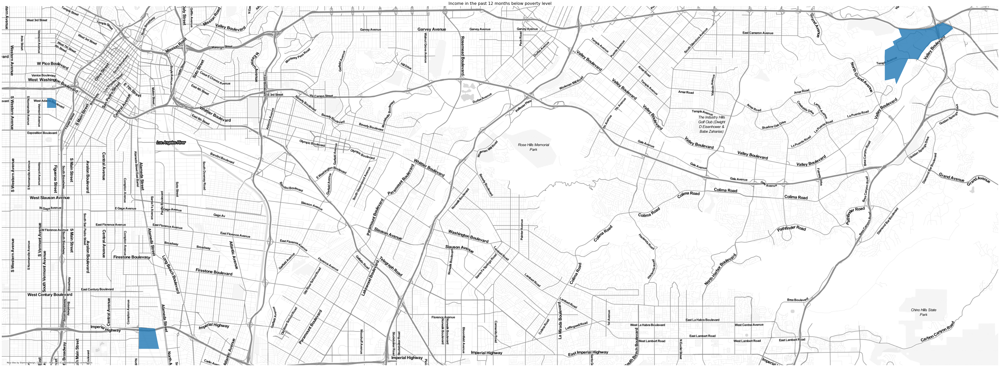

In [14]:
fig, ax = plt.subplots(figsize=(70, 70))

employmt_stat_web_mercator[employmt_stat_web_mercator['Percent Unemployed']> 15].plot(ax=ax, alpha=0.8)

ax.axis('off')

ax.set_title('Income in the past 12 months below poverty level',fontsize=16)

ctx.add_basemap(ax, source=ctx.providers.Stamen.TonerLite)

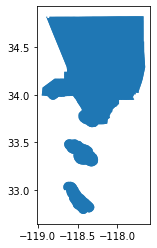

In [15]:
employmt_stat.plot()

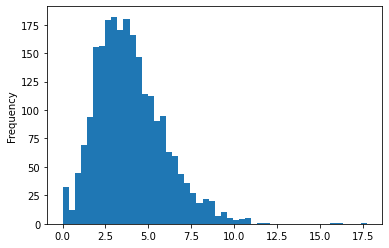

In [19]:
employmt_stat['Percent Unemployed'].plot.hist(bins=50)

In [25]:
employmt_stat['Percent Unemployed'].describe()

count    2327.000000
mean        3.944100
std         1.993725
min         0.000000
25%         2.534475
50%         3.674259
75%         5.092126
max        17.735294
Name: Percent Unemployed, dtype: float64

In [16]:
employ_sorted = employmt_stat.sort_values(by='Percent Unemployed',ascending = False)

In [17]:
employ_sorted[['name','Percent Unemployed', 'Percent Employed']].head(50)

,name,Percent Unemployed,Percent Employed
1664,"Census Tract 5406, Los Angeles, CA",17.735294,49.058824
684,"Census Tract 2218.20, Los Angeles, CA",16.202091,34.712544
1106,"Census Tract 4024.04, Los Angeles, CA",15.682062,20.032223
1689,"Census Tract 5424.01, Los Angeles, CA",12.009738,48.390587
414,"Census Tract 1901, Los Angeles, CA",11.680517,73.730379
408,"Census Tract 1897.02, Los Angeles, CA",10.796020,59.850746
505,"Census Tract 2016.01, Los Angeles, CA",10.766046,55.072464
762,"Census Tract 2362.02, Los Angeles, CA",10.762135,55.150450
423,"Census Tract 1908.01, Los Angeles, CA",10.741483,50.701403
751,"Census Tract 2345.02, Los Angeles, CA",10.675730,48.380648


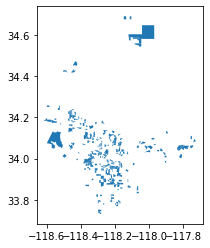

In [18]:
employ_sorted.head(300).plot()

In [19]:
employ_sorted_web_mercator = employ_sorted.to_crs(epsg=3857)

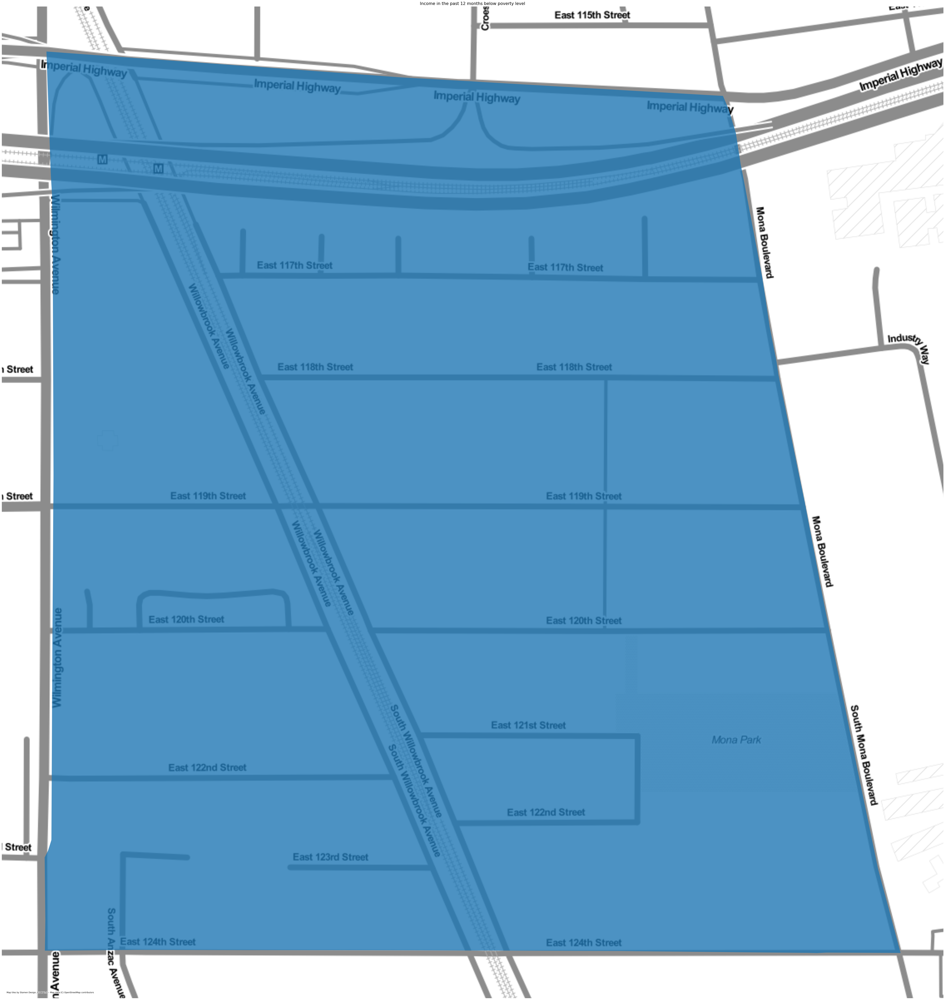

In [20]:
fig, ax = plt.subplots(figsize=(70, 70))

employ_sorted_web_mercator[employ_sorted_web_mercator['Percent Unemployed']> 17].plot(ax=ax, alpha=0.8)

ax.axis('off')

ax.set_title('Income in the past 12 months below poverty level',fontsize=16)

ctx.add_basemap(ax, source=ctx.providers.Stamen.TonerLite)

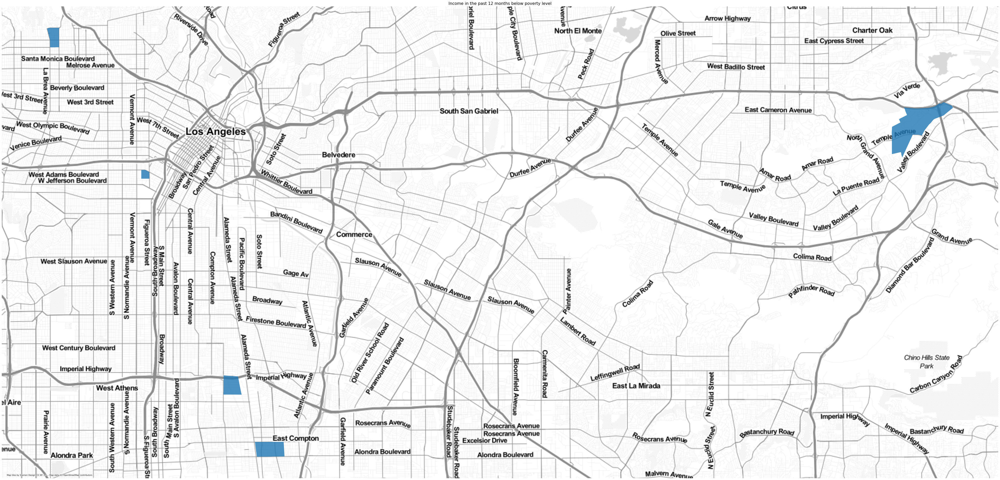

In [21]:
fig, ax = plt.subplots(figsize=(70, 70))

employ_sorted_web_mercator[employ_sorted_web_mercator['Percent Unemployed'] > 11].plot(ax=ax, alpha=0.8)

ax.axis('off')

ax.set_title('Income in the past 12 months below poverty level',fontsize=16)

ctx.add_basemap(ax, source=ctx.providers.Stamen.TonerLite)

In [22]:
mincome_stat.describe()

,B19013001,"B19013001, Error"
count,2311.000000,2307.000000
mean,73240.594548,13528.471175
std,34508.703383,9145.034602
min,9191.000000,347.000000
25%,48194.000000,7744.000000
50%,66250.000000,11455.000000
75%,90398.500000,16566.000000
max,250001.000000,136896.000000
